In [1]:
# Parameters
notebook_name = "Mean_wave_period_ERA5_comparison_rendered.ipynb"
esm_file = "/g/data/zv30/non-cmip/ACCESS-CM3/cm3-run-20-01-2026-om3-update/cm3-datastore/cm3-datastore.json"
plotfolder = "/g/data/tm70/ek4684/access-om3-paper-1/notebooks/mkfigs_output_-11/"


In [2]:
# Parameters – this is the ONLY place you should edit
# when switching models / experiments / obs datasets.

### USER EDIT start

# ESM datastore (model output) – change this for a different run/model
# ESM datastores (model output) to compare against ERA5
esm_files = [
    "/g/data/tm70/ek4684/Standalone_WW3/archive/experiment_datastore.json",
    "/g/data/tm70/ek4684/Standalone_WW3_ERA5/archive/experiment_datastore.json",
    "/g/data/tm70/ek4684/Standalone_WW3_ERA5_neutral_winds/archive/experiment_datastore.json",
    "/g/data/tm70/ek4684/MCW_100km_jra_iaf_IC4_KPP/archive/experiment_datastore.json",
]

# Backward compatibility: existing single-run cells use the first datastore
esm_file = esm_files[0]

# What physical field you want, in CF terms (stays the same across models)
variable_standard_name = "Mean wave period (Tm0,2)"

# Fallback variable name to use if the catalog doesn’t expose standard_name
fallback_variable_names = ["T02"]


# Optional fallback grid file for lon/lat when catalog has only nx/ny
grid_lonlat_file = "/g/data/vk83/prerelease/configurations/inputs/access-om3/mom/initial_conditions/global.100km/2025.10.24/woa23_ts_01_mom.nc"
grid_lon_name = "lon"
grid_lat_name = "lat"

# Frequency depends on the datastore you’re using:
data_frequency = "1mon"

# Latitude bounds for bias/statistics mask (degrees_north)
bias_lat_min = -60.0
bias_lat_max = 60.0

# Optional special-case switches (e.g. 25 km quirks)
APPLY_OBS_25KM_Y_SLICE = False

# Plot settings
dpi = 300

### USER EDIT stop

import os
import sys
from matplotlib import rcParams

# Change working directory to the notebooks folder in the repo
project_root = f"/g/data/tm70/{os.environ['USER']}/access-om3-paper-1"
notebooks_dir = os.path.join(project_root, "notebooks")

# This makes CWD match where SST.ipynb and exptdata_access.py live
os.chdir(notebooks_dir)
print("Changed working directory to:", os.getcwd())

from exptdata_access import get_experiment_info, guess_experiment_from_esm_file
from model_agnostic import get_lon_lat_from_catalog, select_variable

%matplotlib inline
rcParams["figure.dpi"] = dpi

plotfolder = f"/g/data/{os.environ['PROJECT']}/{os.environ['USER']}/access-om3-paper-figs/"
os.makedirs(plotfolder, exist_ok=True)

cache_file = "/g/data/tm70/ek4684/ezhil_notebooks/era5_mwp2_mean_1958_2013.nc"

# WHACS hindcast files (1-hourly t02) and cached all-time mean
whacs_file_glob = "/g/data/ia39/WP3/release/ACS_hindcast/gridded/release/WP3/WHACS/BoM-CSIRO/hindcast/ERA5/ERA5/WHACS/WWIII-v6.07/global-R8/1hr/t02/t02_WHACS_hindcast_WHACS_ERA5_1hr_*"
whacs_cache_file = "/g/data/tm70/ek4684/ezhil_notebooks/whacs_t02_mean_alltime.nc"

# Infer model information from the datastore path
expt_key, info = guess_experiment_from_esm_file(esm_file)

model_name = info["model"]             # OM3 or CM3
exptname = os.path.basename(os.path.dirname(os.path.dirname(esm_file)))

print(f"Running notebook for model: {model_name}")
print("Primary ESM datastore path:", esm_file)
print("All ESM datastore paths for multi-run comparison:")
for i, p in enumerate(esm_files, start=1):
    print(f"  {i}) {p}")
print("Plot folder path:", plotfolder)

Changed working directory to: /g/data/tm70/ek4684/access-om3-paper-1/notebooks


Running notebook for model: Unknown
Primary ESM datastore path: /g/data/tm70/ek4684/Standalone_WW3/archive/experiment_datastore.json
All ESM datastore paths for multi-run comparison:
  1) /g/data/tm70/ek4684/Standalone_WW3/archive/experiment_datastore.json
  2) /g/data/tm70/ek4684/Standalone_WW3_ERA5/archive/experiment_datastore.json
  3) /g/data/tm70/ek4684/Standalone_WW3_ERA5_neutral_winds/archive/experiment_datastore.json
  4) /g/data/tm70/ek4684/MCW_100km_jra_iaf_IC4_KPP/archive/experiment_datastore.json
Plot folder path: /g/data/tm70/ek4684/access-om3-paper-figs/


In [3]:
print(exptname)

Standalone_WW3


In [4]:
import xarray as xr
import cf_xarray as cfxr
import cf_xarray.units
import pint_xarray
import numpy as np
from pint import application_registry as ureg
import intake
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import matplotlib.path as mpath
from matplotlib.colors import LogNorm
from distributed import Client
import cftime
import os, glob
import matplotlib.pyplot as plt
import cmocean as cm
import cartopy.crs as ccrs
import cartopy.feature as cft
from textwrap import wrap
import cmocean.cm as cmo
from matplotlib.ticker import FormatStrFormatter
from cartopy.util import add_cyclic_point
from typing import Iterable, Optional, Sequence, Tuple, Union
import xesmf as xe


xr.set_options(keep_attrs=True);  # cf_xarray works best when xarray keeps attributes by default

import matplotlib.gridspec as gridspec
import matplotlib.lines as mlines
import string
import xesmf
import cmocean

In [5]:
client = Client(threads_per_worker=1)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 48
Total threads: 48,Total memory: 188.56 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:36163,Workers: 0
Dashboard: http://127.0.0.1:8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:32791,Total threads: 1
Dashboard: http://127.0.0.1:42259/status,Memory: 3.93 GiB
Nanny: tcp://127.0.0.1:36421,


In [6]:
blue_marble = plt.imread('/g/data/ik11/grids/BlueMarble.tiff')
blue_marble_extent = (-180, 180, -90, 90)

In [7]:
if os.path.exists(cache_file):
    print(f"Loading cached ERA5 mean: {cache_file}")
    era_mean = xr.open_dataset(cache_file)["p140126"]

else:
    print("Cached file not found — computing ERA5 mean")
    base = "/g/data/rt52/era5/single-levels/reanalysis/mwp2"
    years = range(1958, 2014)  # inclusive of 1968
    files = []
    for y in years:
        files += sorted(glob.glob(f"{base}/{y}/mwp2_era5_wave_sfc_{y}*.nc"))
    print("nfiles:", len(files))
    print("first:", files[0])
    print("last :", files[-1])
                
    ds_era = xr.open_mfdataset(
            files,
            combine="by_coords",
            parallel=True,
            chunks={"time": 744},   # one month (or use chunks="auto")
        )["p140126"]
        
    # optional: reduce memory bandwidth
    ds_era = ds_era.astype("float32")
        
    era_mean = ds_era.mean("time").compute()
    print("era_mean dims:", era_mean.dims)
    
    # Save to disk (this triggers computation)   
    era_mean.to_dataset(name="p140126").to_netcdf(cache_file,
            encoding={
            "p140126": {
                "zlib": True,
                "complevel": 4,
                "dtype": "float32",
                "_FillValue": -1.0e20,}})
    print(f"Saved ERA5 mean to {cache_file}")

Loading cached ERA5 mean: /g/data/tm70/ek4684/ezhil_notebooks/era5_mwp2_mean_1958_2013.nc


In [8]:
# Load WHACS t02 and compute all-time mean (cached)
if os.path.exists(whacs_cache_file):
    print(f"Loading cached WHACS mean: {whacs_cache_file}")
    whacs_mean = xr.open_dataset(whacs_cache_file)["t02"]
else:
    whacs_files = sorted(glob.glob(whacs_file_glob))
    if len(whacs_files) == 0:
        raise FileNotFoundError(f"No WHACS files matched glob: {whacs_file_glob}")

    print("WHACS nfiles:", len(whacs_files))
    print("WHACS first:", whacs_files[0])
    print("WHACS last :", whacs_files[-1])

    ds_whacs = xr.open_mfdataset(
        whacs_files,
        combine="by_coords",
        parallel=True,
        chunks={"time": 744},
    )
    da_whacs = ds_whacs["t02"].astype("float32")
    whacs_mean = da_whacs.mean("time").compute()

    whacs_mean.to_dataset(name="t02").to_netcdf(
        whacs_cache_file,
        encoding={
            "t02": {
                "zlib": True,
                "complevel": 4,
                "dtype": "float32",
                "_FillValue": -1.0e20,
            }
        },
    )
    print(f"Saved WHACS mean to {whacs_cache_file}")

print("WHACS mean dims:", whacs_mean.dims)


Loading cached WHACS mean: /g/data/tm70/ek4684/ezhil_notebooks/whacs_t02_mean_alltime.nc
WHACS mean dims: ('latitude', 'longitude')


In [9]:
def available_variables(datastore):
    """Return a pandas dataframe summarising the variables in a datastore"""
    variable_columns = [col for col in datastore.df.columns if "variable" in col]
    return (
        datastore.df[variable_columns]
        .explode(variable_columns)
        .drop_duplicates()
        .set_index("variable")
        .sort_index()
    )

In [10]:
def _align_lonlat_dims(da_model, lon, lat):
    # propose mapping from common grid dims -> model dims
    proposed = {
        "lonh": "nx", "xh": "nx", "x": "nx", "xt_ocean": "nx", "lon": "nx", "longitude": "nx",
        "lath": "ny", "yh": "ny", "y": "ny", "yt_ocean": "ny", "lat": "ny", "latitude": "ny",
    }

    def _rename_only_existing(da):
        # keep only keys that exist in this DataArray (dims or coords)
        mapping = {k: v for k, v in proposed.items() if (k in da.dims) or (k in da.coords)}
        return da.rename(mapping) if mapping else da

    lon = _rename_only_existing(lon)
    lat = _rename_only_existing(lat)

    # sanity checks (only for overlapping dims)
    for d in set(lon.dims).intersection(da_model.dims):
        if lon.sizes[d] != da_model.sizes[d]:
            raise ValueError(f"lon size mismatch on dim {d}: {lon.sizes[d]} vs {da_model.sizes[d]}")
    for d in set(lat.dims).intersection(da_model.dims):
        if lat.sizes[d] != da_model.sizes[d]:
            raise ValueError(f"lat size mismatch on dim {d}: {lat.sizes[d]} vs {da_model.sizes[d]}")

    return lon, lat

In [11]:

def time_percentiles(
    da: xr.DataArray,
    *,
    time_dim: str = "time",
    q_levels: Sequence[float] = (0.90, 0.99),
    mask: Optional[xr.DataArray] = None,
    skipna: bool = True,
    eps_min_count: int = 1,     # require at least this many valid samples along time
    compute: bool = False,      # keep lazy by default
    name: Optional[str] = None,
) -> xr.Dataset:
    """
    Compute percentile maps over time for a single dataset.

    Parameters
    ----------
    da : xr.DataArray
        Must include `time_dim` plus spatial dims (e.g., ny,nx or lat,lon).
    time_dim : str
        Name of the time dimension.
    q_levels : sequence of float
        Quantile levels in (0,1), e.g. (0.9, 0.99).
    mask : xr.DataArray, optional
        Boolean mask (True=keep). Can be static (ny,nx) or time-varying (time,ny,nx).
    skipna : bool
        Ignore NaNs along time when computing quantiles.
    eps_min_count : int
        Mask output where fewer than this many finite samples exist along time.
        Helps avoid garbage where obs is mostly missing (ice/land edges).
    compute : bool
        If True, compute immediately (useful before saving).
    name : str, optional
        Base name for output variables.

    Returns
    -------
    xr.Dataset
        Variables like q90_<name>, q99_<name> (maps on spatial dims).
    """
    if time_dim not in da.dims:
        raise ValueError(f"DataArray must have time dimension '{time_dim}'. Found dims={da.dims}")

    da_a = da
    varname = name or da_a.name or "var"

    # Apply mask if provided
    if mask is not None:
        mask_a, da_a = xr.align(mask, da_a, join="inner")
        da_a = da_a.where(mask_a.astype(bool))

    # Ensure we don't return percentiles where there's basically no data
    n_valid = da_a.notnull().sum(time_dim)
    out = xr.Dataset()

    for q in q_levels:
        if not (0.0 < q < 1.0):
            raise ValueError(f"Quantiles must be in (0,1). Got {q}")

        tag = f"q{int(round(q * 100)):02d}_{varname}"
        qmap = da_a.quantile(q, dim=time_dim, skipna=skipna)

        # Mask cells with too few valid samples
        qmap = qmap.where(n_valid >= eps_min_count)

        out[tag] = qmap

    out.attrs.update({
        "description": "Time-percentile maps for a single variable",
        "time_dim": time_dim,
        "q_levels": ",".join(str(x) for x in q_levels),
        "min_valid_count": int(eps_min_count),
        "variable": varname,
    })

    return out.compute() if compute else out

In [12]:
def plot(dat, title=None, projection=None, add_blue_marble=True, **kwargs):
    """
    Generic 2D map plot helper for model / obs / bias fields.

    - Works for any variable (SST, SSH, salinity, etc.).
    - Assumes the last two dimensions are (y, x) horizontal dims.
    - Uses contourf with a cartopy projection.
    """

    import matplotlib.pyplot as plt
    import cartopy.crs as ccrs
    from textwrap import wrap

    # Make sure we're working with a DataArray
    da = dat
    if not isinstance(da, xr.DataArray):
        raise TypeError("plot() expects an xarray.DataArray")

    # Handle simple time dimension cases (e.g. time-mean or single time step)
    if da.ndim == 3 and "time" in da.dims and da.sizes["time"] == 1:
        da = da.isel(time=0, drop=True)

    if da.ndim != 2:
        raise ValueError(
            f"plot() expects a 2D field or a 3D field with singleton time; got dims {da.dims}"
        )

    # Infer horizontal dims as the last two dims
    ydim, xdim = da.dims[-2], da.dims[-1]

    # Title and colourbar label from attributes
    long_name = da.attrs.get("long_name", da.name or "Field")
    units = da.attrs.get("units", "")

    if title is None:
        title = long_name

    cbar_label = long_name if units == "" else f"{long_name} [{units}]"
    cbar_label = "\n".join(wrap(cbar_label, 45))

    # Projection: default to Robinson
    if projection is None:
        projection = ccrs.Robinson(central_longitude=-100)

    fig = plt.figure(figsize=(12, 6))
    ax = plt.axes(projection=projection)

    # Main filled contour plot
    da.plot.contourf(
        ax=ax,
        x=xdim,
        y=ydim,
        transform=ccrs.PlateCarree(),
        cbar_kwargs={
            "label": cbar_label,
            "fraction": 0.03,
            "aspect": 15,
            "shrink": 0.7,
        },
        **kwargs,
    )

    # Optional blue marble overlay if available
    # if add_blue_marble and "blue_marble" in globals() and "blue_marble_extent" in globals():
    #    ax.imshow(
    #        blue_marble,
    #        extent=blue_marble_extent,
    #        transform=ccrs.PlateCarree(),
    #        origin="upper",
    #    )

    ax.coastlines()
    plt.title(title)
    plt.tight_layout()

In [13]:
def wrap_lon_360(da, lon_name="longitude"):
    lon = da[lon_name]
    lon2 = lon % 360
    return da.assign_coords({lon_name: lon2}).sortby(lon_name)

In [14]:
def wrap_lon_180(da, lon_name="longitude"):
    lon = da[lon_name]
    lon2 = ((lon + 180) % 360) - 180
    return da.assign_coords({lon_name: lon2}).sortby(lon_name)

In [15]:
exptname=os.path.basename(os.path.dirname(esm_file))
print("Experiment name:", exptname)

datastore = intake.open_esm_datastore(
    esm_file,
    columns_with_iterables=[
        "variable",
        "variable_long_name",
        "variable_standard_name",
        "variable_cell_methods",
        "variable_units"
    ]
)

Experiment name: archive


In [16]:
datastore_filtered = datastore.search(realm="wave")

datastore_filtered

,unique
filename,3683
file_id,1
path,3683
filename_timestamp,3683
frequency,1
start_date,3683
end_date,3683
variable,15
variable_long_name,15
variable_standard_name,1


In [17]:
da_model = select_variable(
    datastore,
    variable_standard_name,
    fallback_variable_names,
    data_frequency=data_frequency,
)
print("Selected variable:", da_model.name)
print("dims:", da_model.dims)

CF-based lookup failed: ValueError('No entries found for this CF standard_name.')
No files matched frequency='1mon'; using any available frequency.


Selected variable via fallback name: T02
Selected variable: T02
dims: ('time', 'ny', 'nx')


In [18]:
# Discover lon/lat from the catalog (using the helper we wrote earlier)
try:
    lon, lat = get_lon_lat_from_catalog(datastore)
    print("Discovered longitude/latitude from datastore catalog.")
except RuntimeError as e:
    print(f"Catalog lon/lat lookup failed: {e}")
    print(f"Falling back to lon/lat from grid file: {grid_lonlat_file}")
    ds_grid = xr.open_dataset(grid_lonlat_file, decode_timedelta=True, use_cftime=True)

    if grid_lon_name not in ds_grid.variables and grid_lon_name not in ds_grid.coords:
        raise KeyError(f"{grid_lon_name!r} not found in {grid_lonlat_file}")
    if grid_lat_name not in ds_grid.variables and grid_lat_name not in ds_grid.coords:
        raise KeyError(f"{grid_lat_name!r} not found in {grid_lonlat_file}")

    lon = ds_grid[grid_lon_name]
    lat = ds_grid[grid_lat_name]

lon, lat = _align_lonlat_dims(da_model, lon, lat)
# Ensure model_all has CF longitude/latitude coords
try:
    # If CF coords already exist, just use them
    _ = da_model.cf["longitude"]
    _ = da_model.cf["latitude"]
    model_all = da_model
    print("Using existing CF longitude/latitude on da_model.")
except KeyError:
    # Otherwise, attach the lon/lat we discovered
    model_all = da_model.cf.assign_coords(
        {
            "longitude": lon,
            "latitude": lat,
        }
    )
    print("Attached longitude/latitude from catalog or fallback grid file.")

print("model_all dims:", model_all.dims)

Catalog lon/lat lookup failed: Could not find any of ('geolon', 'geolon_t', 'lonh', 'lonq', 'xt_ocean', 'lon') in datastore
Falling back to lon/lat from grid file: /g/data/vk83/prerelease/configurations/inputs/access-om3/mom/initial_conditions/global.100km/2025.10.24/woa23_ts_01_mom.nc
Attached longitude/latitude from catalog or fallback grid file.
model_all dims: ('time', 'ny', 'nx')


/jobfs/161547605.gadi-pbs/ipykernel_21097/1794731697.py:8: DeprecationWarning: Usage of 'use_cftime' as a kwarg is deprecated. Please pass a 'CFDatetimeCoder' instance initialized with 'use_cftime' to the 'decode_times' kwarg instead.
Example usage:
    time_coder = xr.coders.CFDatetimeCoder(use_cftime=True)
    ds = xr.open_dataset(decode_times=time_coder)

  ds_grid = xr.open_dataset(grid_lonlat_file, decode_timedelta=True, use_cftime=True)


In [19]:
averaging_mode = "last_n_years"   # or "full_period" / "fixed_period"
averaging_last_n_years = 2
averaging_start_date = None
averaging_end_date   = None

In [20]:
# Put model time axis on a common calendar
model_all = model_all.convert_calendar("proleptic_gregorian", use_cftime=True)

# Inspect full time coverage
t0 = model_all.time.values[0]
t1 = model_all.time.values[-1]
print("Full model time range:", t0, "→", t1)

# Decide the averaging window based on configuration
if averaging_mode == "full_period":
    datestart = t0
    datestop = t1

elif averaging_mode == "last_n_years":
    datestop = t1
    # Subtract N years in a calendar-aware way
    datelist = list(cftime.to_tuple(datestop))
    datelist[0] -= averaging_last_n_years
    datestart = cftime.datetime(*datelist, calendar=datestop.calendar)

elif averaging_mode == "fixed_period":
    if averaging_start_date is None or averaging_end_date is None:
        raise ValueError(
            "averaging_mode='fixed_period' requires averaging_start_date and averaging_end_date"
        )
    # Use cftime to create start/end on the same calendar
    datestart = xr.cftime_range(
        start=averaging_start_date,
        periods=1,
        calendar="proleptic_gregorian",
    )[0]
    datestop = xr.cftime_range(
        start=averaging_end_date,
        periods=1,
        calendar="proleptic_gregorian",
    )[0]
else:
    raise ValueError(f"Unknown averaging_mode: {averaging_mode!r}")

timerange = slice(datestart, datestop)
print("Averaging window:", timerange)

# Restrict model to this configured window
model_window = model_all.cf.sel(time=timerange)
print("Windowed dims:", model_window.dims)

Full model time range: 1958-01-02 00:00:00 → 1978-01-31 00:00:00
Averaging window: slice(cftime.datetime(1976, 1, 31, 0, 0, 0, 0, calendar='proleptic_gregorian', has_year_zero=True), cftime.DatetimeProlepticGregorian(1978, 1, 31, 0, 0, 0, 0, has_year_zero=True), None)
Windowed dims: ('time', 'ny', 'nx')


In [21]:
%%time
model = (
    model_window
    .cf.mean("time")          # CF-aware: whatever the time dim is called
    .pint.quantify()          # attach Pint units from attrs["units"]
    .pint.to("s")             # convert to m
    .pint.dequantify()        # back to plain DataArray for plotting / saving
)

print("Final model dims:", model.dims)
print("Final model units:", model.attrs.get("units"))

Final model dims: ('ny', 'nx')
Final model units: second
CPU times: user 47 ms, sys: 185 μs, total: 47.2 ms
Wall time: 45.2 ms


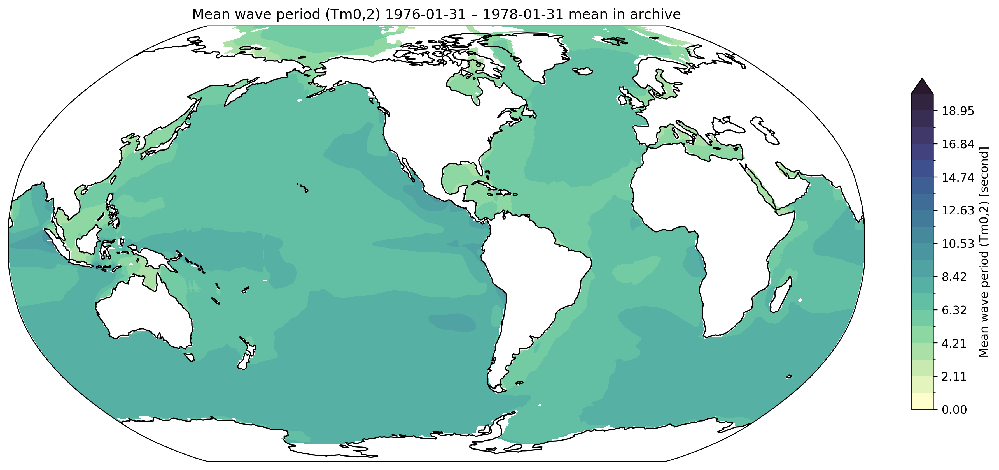

In [22]:
long_name = model.attrs.get("long_name", "Tm0,2")

ax = plot(
    model,
    levels=20,
    vmin=0,
    vmax=20,
    extend="max",
    cmap= cmocean.cm.deep,
    title=(
        f"{long_name} "
        f"{datestart.strftime('%Y-%m-%d')} – {datestop.strftime('%Y-%m-%d')} "
        f"mean in {exptname}"
    ),
)

In [23]:
# strip any attrs that might make nx/ny look like lon/lat
if "nx" in model.coords:
    model["nx"].attrs = {}
if "ny" in model.coords:
    model["ny"].attrs = {}

# (optional) also ensure your real lon/lat have clear CF attrs
model["longitude"].attrs.update({"standard_name": "longitude", "units": "degrees_east"})
model["latitude"].attrs.update({"standard_name": "latitude", "units": "degrees_north"})

In [24]:
da_obs = era_mean
# 3) Make sure longitude / latitude coords are available in CF terms
try:
    _ = da_obs.cf["longitude"]
    _ = da_obs.cf["latitude"]
except KeyError:
    # If obs uses plain 'lon'/'lat' dims, expose them as CF coords
    rename_dict = {}
    if "lon" in da_obs.dims:
        rename_dict["lon"] = "longitude"
    if "lat" in da_obs.dims:
        rename_dict["lat"] = "latitude"
    if rename_dict:
        da_obs = da_obs.rename(rename_dict)

print("Obs dims:", da_obs.dims)
print("Obs coords:", list(da_obs.coords))

Obs dims: ('latitude', 'longitude')
Obs coords: ['longitude', 'latitude']


In [25]:
da_obs = era_mean  # dims: latitude, longitude

# 1) Make obs monotonic and in [-180, 180)
da_obs = da_obs.sortby("latitude")
obs_lon180 = ((da_obs["longitude"] + 180) % 360) - 180
da_obs = da_obs.assign_coords(longitude=obs_lon180).sortby("longitude")

# 2) Wrap MODEL target lon into [-180, 180) for interpolation
model_lon = model["longitude"]              # your -279.5..79.5
model_lon180 = ((model_lon + 180) % 360) - 180

# interp needs monotonic x; sort lon180 but keep index to restore
nx_sort = np.argsort(model_lon180.values)
model_lon180_sorted = model_lon180.isel(nx=nx_sort)

# latitude target (already monotonic, but keep as-is)
model_lat = model["latitude"]

# 3) Interpolate onto wrapped lon target
obs_on_model_sorted = da_obs.interp(
    longitude=model_lon180_sorted,
    latitude=model_lat,
    method="linear",
)

# Optional fill where linear hits gaps (coast/mask edges)
obs_on_model_nn = da_obs.interp(
    longitude=model_lon180_sorted,
    latitude=model_lat,
    method="nearest",
)
obs_on_model_sorted = obs_on_model_sorted.where(obs_on_model_sorted.notnull(), obs_on_model_nn)

# 4) Restore original nx order and original model lon coords (-279.5..79.5)
inv_nx = np.empty_like(nx_sort)
inv_nx[nx_sort] = np.arange(nx_sort.size)

obs_on_model = obs_on_model_sorted.isel(nx=inv_nx).assign_coords(
    longitude=model_lon,      # restore -279.5..79.5
    latitude=model_lat,
)

In [26]:
obs_lin = da_obs.interp(
    longitude=model_lon180_sorted,
    latitude=model_lat,
    method="linear",
).isel(nx=inv_nx).assign_coords(longitude=model_lon, latitude=model_lat)

era_mask_on_model = obs_lin.notnull()

# Apply the ERA mask to BOTH obs and model (so bias is only where ERA is valid)
obs_on_model = obs_on_model.where(era_mask_on_model)
model_masked = model.where(era_mask_on_model)

# Apply latitude mask so bias/stats use only [-60, 60] degrees
if "latitude" in obs_on_model.coords:
    lat_mask = (obs_on_model["latitude"] >= bias_lat_min) & (obs_on_model["latitude"] <= bias_lat_max)
    obs_on_model = obs_on_model.where(lat_mask)
    model_masked = model_masked.where(lat_mask)
else:
    print("Warning: latitude coordinate not found; skipping latitude mask.")

In [27]:
# 5) Now bias
bias = (model_masked - obs_on_model).compute()
print("bias finite:", int(np.isfinite(bias).sum()), "of", bias.size)

bias finite: 49680 of 108000


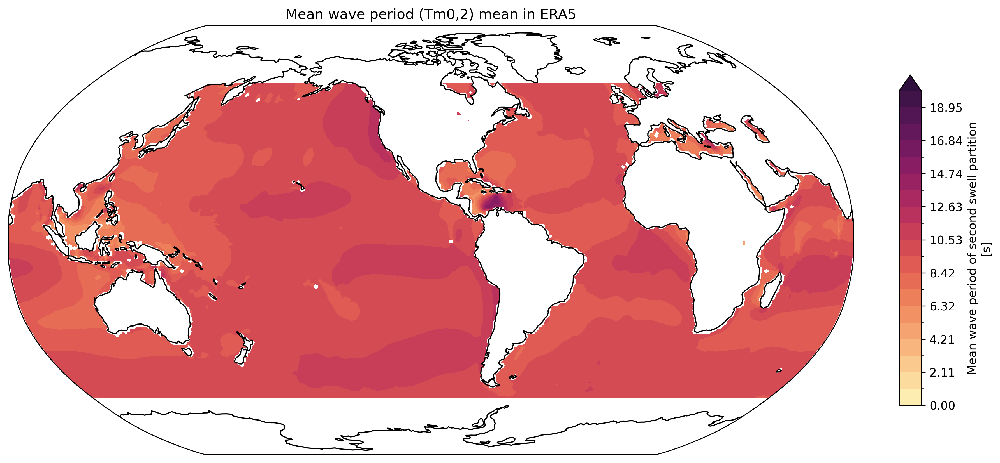

In [28]:
ax = plot(
    obs_on_model,
    levels=20,
    vmin=0,
    vmax=20,
    extend="max",
    cmap= cmocean.cm.matter,
    title=(
        f"{long_name} "
        f"mean in ERA5"
    ),
)

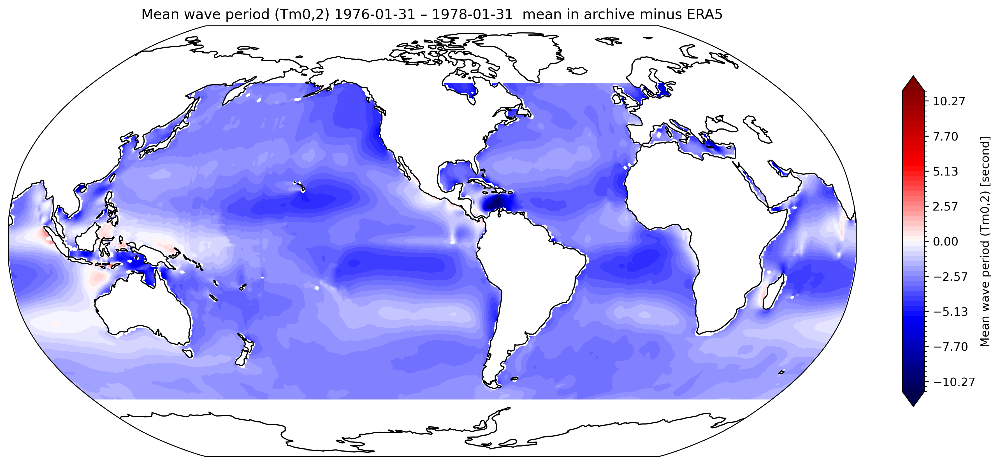

In [29]:
# 3) Plot the bias
long_name = model.attrs.get("long_name", "HS")

plot(
    bias,
    levels=61,
    vmin =-11,
    vmax=11,
    extend="both",
    cmap="seismic",
    title=(
        f"{long_name} "
        f"{datestart.strftime('%Y-%m-%d')} – {datestop.strftime('%Y-%m-%d')} "
        f" mean in {exptname} minus ERA5"
    ),
)

In [30]:
# Mask invalid / near-zero obs to avoid blow-ups
eps = 0.05  # 5 cm threshold, adjust if needed
valid = obs_on_model > eps

del_hs_pct = xr.where(
    valid,
    100.0 * bias / obs_on_model,
    np.nan
)

del_hs_pct.name = "del_hs_pct"
del_hs_pct.attrs.update({
    "long_name": "Percentage bias in significant wave height",
    "units": "%",
    "description": "(model - obs) / obs * 100"
})

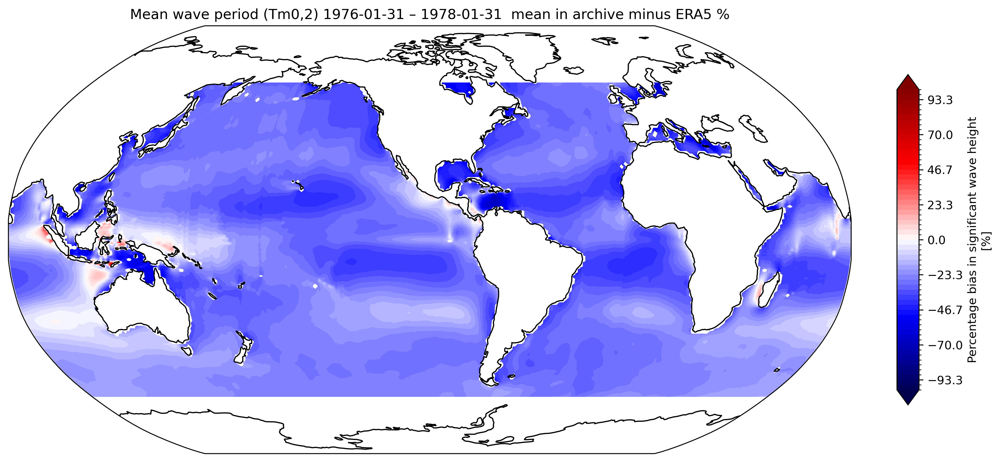

In [31]:
plot(
    del_hs_pct,
    levels=61,
    extend="both",
    cmap="seismic",
    vmin = -100,
    vmax = 100,
    title=(
        f"{long_name} "
        f"{datestart.strftime('%Y-%m-%d')} – {datestop.strftime('%Y-%m-%d')} "
        f" mean in {exptname} minus ERA5 %"
    ),
)

In [32]:
common_mask = np.isfinite(obs_on_model) & np.isfinite(model)
model_q = time_percentiles(model_window, mask=common_mask, name="tm", compute=False)

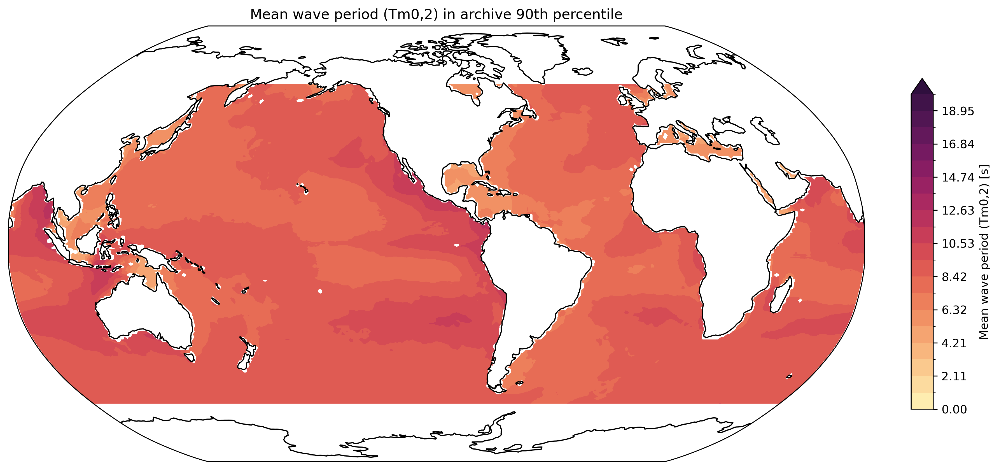

In [33]:
ax = plot(
    model_q.q90_tm,
    levels=20,
    vmin=0,
    vmax=20,
    extend="max",
    cmap= cmocean.cm.matter,
    title=(
        f"{long_name} in {exptname} "
        f"90th percentile"
    ),
)

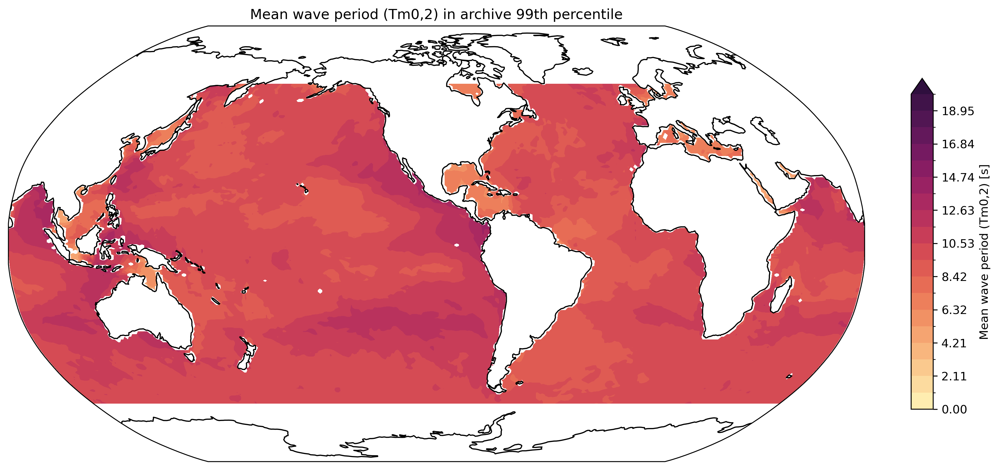

In [34]:
ax = plot(
    model_q.q99_tm,
    levels=20,
    vmin=0,
    vmax=20,
    extend="max",
    cmap= cmocean.cm.matter,
    title=(
        f"{long_name} in {exptname} "
        f"99th percentile"
    ),
)

## Multi-Run Comparison (All ESM Files vs ERA5 and WHACS)


In [35]:
from pathlib import Path


def _ensure_obs_cf(da_obs: xr.DataArray) -> xr.DataArray:
    """Ensure observation field has CF longitude/latitude and unique wrapped longitudes."""
    da = da_obs
    rename_dict = {}
    if "lon" in da.dims and "longitude" not in da.dims:
        rename_dict["lon"] = "longitude"
    if "lat" in da.dims and "latitude" not in da.dims:
        rename_dict["lat"] = "latitude"
    if rename_dict:
        da = da.rename(rename_dict)

    da = da.sortby("latitude")
    obs_lon180 = ((da["longitude"] + 180) % 360) - 180
    da = da.assign_coords(longitude=obs_lon180).sortby("longitude")

    # Interp requires unique index values; wrapped grids can duplicate seam longitudes.
    lon_index = da.get_index("longitude")
    if not lon_index.is_unique:
        da = da.isel(longitude=~lon_index.duplicated(keep="first"))

    return da


def _as_1d_coord(coord: xr.DataArray, *, xdim: str, ydim: str, kind: str) -> xr.DataArray:
    """
    Return a 1D lon/lat coordinate for interpolation targets.
    Supports 1D coords directly, or 2D rectilinear coords by taking one slice.
    """
    if coord.ndim == 1:
        return coord

    if coord.ndim == 2 and xdim in coord.dims and ydim in coord.dims:
        if kind == "lon":
            return coord.isel({ydim: 0}, drop=True)
        if kind == "lat":
            return coord.isel({xdim: 0}, drop=True)

    raise ValueError(
        f"Expected 1D or rectilinear 2D {kind} coordinate; got dims={coord.dims}, ndim={coord.ndim}"
    )


def _compute_window(model_all: xr.DataArray):
    """Apply notebook-configured averaging window and return model subset + dates."""
    avg_mode = globals().get("averaging_mode", "last_n_years")
    avg_last_n = globals().get("averaging_last_n_years", 1)
    avg_start = globals().get("averaging_start_date", "1976-01-02")
    avg_end = globals().get("averaging_end_date", None)

    model_all = model_all.convert_calendar("proleptic_gregorian", use_cftime=True)
    t0 = model_all.time.values[0]
    t1 = model_all.time.values[-1]

    if avg_mode == "full_period":
        datestart, datestop = t0, t1
    elif avg_mode == "last_n_years":
        datestop = t1
        datelist = list(cftime.to_tuple(datestop))
        datelist[0] -= avg_last_n
        datestart = cftime.datetime(*datelist, calendar=datestop.calendar)
    elif avg_mode == "fixed_period":
        if avg_start is None or avg_end is None:
            raise ValueError("fixed_period requires averaging_start_date and averaging_end_date")
        datestart = xr.cftime_range(start=avg_start, periods=1, calendar="proleptic_gregorian")[0]
        datestop = xr.cftime_range(start=avg_end, periods=1, calendar="proleptic_gregorian")[0]
    else:
        raise ValueError(f"Unknown averaging_mode: {avg_mode!r}")

    return model_all.cf.sel(time=slice(datestart, datestop)), datestart, datestop


def _prepare_single_experiment(esm_path: str) -> dict:
    expt = Path(esm_path).parents[1].name
    print(f"\nLoading model mean for: {expt}")
    print(f"  datastore: {esm_path}")

    datastore = intake.open_esm_datastore(
        esm_path,
        columns_with_iterables=[
            "variable",
            "variable_long_name",
            "variable_standard_name",
            "variable_cell_methods",
            "variable_units",
        ],
    )

    da_model = select_variable(
        datastore,
        variable_standard_name,
        fallback_variable_names,
        data_frequency=data_frequency,
    )

    try:
        lon, lat = get_lon_lat_from_catalog(datastore)
    except RuntimeError as e:
        print(f"  catalog lon/lat not found ({e}); using fallback grid file")
        ds_grid = xr.open_dataset(grid_lonlat_file, decode_timedelta=True, use_cftime=True)
        lon = ds_grid[grid_lon_name]
        lat = ds_grid[grid_lat_name]

    lon, lat = _align_lonlat_dims(da_model, lon, lat)

    try:
        _ = da_model.cf["longitude"]
        _ = da_model.cf["latitude"]
        model_all = da_model
    except KeyError:
        model_all = da_model.cf.assign_coords({"longitude": lon, "latitude": lat})

    model_window, datestart, datestop = _compute_window(model_all)

    model_mean = model_window.cf.mean("time").pint.quantify()
    try:
        model_mean = model_mean.pint.to("s")
    except Exception:
        pass
    model_mean = model_mean.pint.dequantify().compute()

    if "nx" in model_mean.coords:
        model_mean["nx"].attrs = {}
    if "ny" in model_mean.coords:
        model_mean["ny"].attrs = {}

    model_mean["longitude"].attrs.update({"standard_name": "longitude", "units": "degrees_east"})
    model_mean["latitude"].attrs.update({"standard_name": "latitude", "units": "degrees_north"})

    ydim, xdim = model_mean.dims[-2], model_mean.dims[-1]
    model_lon = _as_1d_coord(model_mean["longitude"], xdim=xdim, ydim=ydim, kind="lon")
    model_lat = _as_1d_coord(model_mean["latitude"], xdim=xdim, ydim=ydim, kind="lat")
    model_mean = model_mean.assign_coords({xdim: model_lon, ydim: model_lat})

    return {
        "esm_file": esm_path,
        "exptname": expt,
        "datestart": datestart,
        "datestop": datestop,
        "xdim": xdim,
        "ydim": ydim,
        "model": model_mean,
    }


def _compare_experiment_to_obs(bundle: dict, obs_base: xr.DataArray, obs_label: str) -> dict:
    model_mean = bundle["model"]
    xdim = bundle["xdim"]
    ydim = bundle["ydim"]

    model_lon = _as_1d_coord(model_mean["longitude"], xdim=xdim, ydim=ydim, kind="lon")
    model_lat = _as_1d_coord(model_mean["latitude"], xdim=xdim, ydim=ydim, kind="lat")

    model_lon180 = ((model_lon + 180) % 360) - 180
    x_sort = np.argsort(model_lon180.values)
    model_lon180_sorted = model_lon180.isel({xdim: x_sort})

    obs_lin = obs_base.interp(longitude=model_lon180_sorted, latitude=model_lat, method="linear")
    obs_nn = obs_base.interp(longitude=model_lon180_sorted, latitude=model_lat, method="nearest")
    obs_sorted = obs_lin.where(obs_lin.notnull(), obs_nn)

    inv_x = np.empty_like(x_sort)
    inv_x[x_sort] = np.arange(x_sort.size)

    obs_on_model = obs_sorted.isel({xdim: inv_x}).assign_coords(
        longitude=model_lon,
        latitude=model_lat,
    )
    obs_valid_mask = obs_lin.isel({xdim: inv_x}).notnull().assign_coords(
        longitude=model_lon,
        latitude=model_lat,
    )

    model_masked = model_mean.where(obs_valid_mask)
    obs_on_model = obs_on_model.where(obs_valid_mask)

    if "latitude" in obs_on_model.coords:
        lat_mask = (obs_on_model["latitude"] >= bias_lat_min) & (obs_on_model["latitude"] <= bias_lat_max)
        obs_on_model = obs_on_model.where(lat_mask)
        model_masked = model_masked.where(lat_mask)

    bias = (model_masked - obs_on_model).compute()
    pct_bias = xr.where(obs_on_model > 0.05, 100.0 * bias / obs_on_model, np.nan)

    mean_bias = float(bias.mean(skipna=True).item())
    rmse = float(np.sqrt((bias ** 2).mean(skipna=True).item()))

    print(
        f"  {bundle['exptname']} vs {obs_label}: "
        f"mean bias={mean_bias:.3f} s, RMSE={rmse:.3f} s"
    )

    return {
        **bundle,
        "obs_label": obs_label,
        "obs_on_model": obs_on_model,
        "bias": bias,
        "pct_bias": pct_bias,
        "mean_bias": mean_bias,
        "rmse": rmse,
    }


obs_for_interp_era5 = _ensure_obs_cf(era_mean)
obs_for_interp_whacs = _ensure_obs_cf(whacs_mean)

model_bundles = [_prepare_single_experiment(path) for path in esm_files]

print("\nComparing each experiment against ERA5 ...")
multi_results_era5 = [_compare_experiment_to_obs(bundle, obs_for_interp_era5, "ERA5") for bundle in model_bundles]
print("Completed multi-run comparison against ERA5.")

print("\nComparing each experiment against WHACS ...")
multi_results_whacs = [_compare_experiment_to_obs(bundle, obs_for_interp_whacs, "WHACS") for bundle in model_bundles]
print("Completed multi-run comparison against WHACS.")

# Backward compatibility with downstream cells expecting these names
obs_for_interp = obs_for_interp_era5
multi_results = multi_results_era5



Loading model mean for: Standalone_WW3
  datastore: /g/data/tm70/ek4684/Standalone_WW3/archive/experiment_datastore.json


CF-based lookup failed: ValueError('No entries found for this CF standard_name.')
No files matched frequency='1mon'; using any available frequency.


Selected variable via fallback name: T02


  catalog lon/lat not found (Could not find any of ('geolon', 'geolon_t', 'lonh', 'lonq', 'xt_ocean', 'lon') in datastore); using fallback grid file


/jobfs/161547605.gadi-pbs/ipykernel_21097/4292283456.py:102: DeprecationWarning: Usage of 'use_cftime' as a kwarg is deprecated. Please pass a 'CFDatetimeCoder' instance initialized with 'use_cftime' to the 'decode_times' kwarg instead.
Example usage:
    time_coder = xr.coders.CFDatetimeCoder(use_cftime=True)
    ds = xr.open_dataset(decode_times=time_coder)

  ds_grid = xr.open_dataset(grid_lonlat_file, decode_timedelta=True, use_cftime=True)



Loading model mean for: Standalone_WW3_ERA5
  datastore: /g/data/tm70/ek4684/Standalone_WW3_ERA5/archive/experiment_datastore.json


CF-based lookup failed: ValueError('No entries found for this CF standard_name.')
No files matched frequency='1mon'; using any available frequency.


Selected variable via fallback name: T02
  catalog lon/lat not found (Could not find any of ('geolon', 'geolon_t', 'lonh', 'lonq', 'xt_ocean', 'lon') in datastore); using fallback grid file


/jobfs/161547605.gadi-pbs/ipykernel_21097/4292283456.py:102: DeprecationWarning: Usage of 'use_cftime' as a kwarg is deprecated. Please pass a 'CFDatetimeCoder' instance initialized with 'use_cftime' to the 'decode_times' kwarg instead.
Example usage:
    time_coder = xr.coders.CFDatetimeCoder(use_cftime=True)
    ds = xr.open_dataset(decode_times=time_coder)

  ds_grid = xr.open_dataset(grid_lonlat_file, decode_timedelta=True, use_cftime=True)



Loading model mean for: Standalone_WW3_ERA5_neutral_winds
  datastore: /g/data/tm70/ek4684/Standalone_WW3_ERA5_neutral_winds/archive/experiment_datastore.json
CF-based lookup failed: ValueError('No entries found for this CF standard_name.')
No files matched frequency='1mon'; using any available frequency.


Selected variable via fallback name: T02
  catalog lon/lat not found (Could not find any of ('geolon', 'geolon_t', 'lonh', 'lonq', 'xt_ocean', 'lon') in datastore); using fallback grid file


/jobfs/161547605.gadi-pbs/ipykernel_21097/4292283456.py:102: DeprecationWarning: Usage of 'use_cftime' as a kwarg is deprecated. Please pass a 'CFDatetimeCoder' instance initialized with 'use_cftime' to the 'decode_times' kwarg instead.
Example usage:
    time_coder = xr.coders.CFDatetimeCoder(use_cftime=True)
    ds = xr.open_dataset(decode_times=time_coder)

  ds_grid = xr.open_dataset(grid_lonlat_file, decode_timedelta=True, use_cftime=True)



Loading model mean for: MCW_100km_jra_iaf_IC4_KPP
  datastore: /g/data/tm70/ek4684/MCW_100km_jra_iaf_IC4_KPP/archive/experiment_datastore.json


CF-based lookup failed: ValueError('No entries found for this CF standard_name.')


No files matched frequency='1mon'; using any available frequency.


Selected variable via fallback name: T02



Comparing each experiment against ERA5 ...
  Standalone_WW3 vs ERA5: mean bias=-2.625 s, RMSE=2.840 s
  Standalone_WW3_ERA5 vs ERA5: mean bias=-2.963 s, RMSE=3.137 s
  Standalone_WW3_ERA5_neutral_winds vs ERA5: mean bias=-2.964 s, RMSE=3.127 s
  MCW_100km_jra_iaf_IC4_KPP vs ERA5: mean bias=-2.727 s, RMSE=2.949 s
Completed multi-run comparison against ERA5.

Comparing each experiment against WHACS ...


  Standalone_WW3 vs WHACS: mean bias=0.740 s, RMSE=0.836 s


  Standalone_WW3_ERA5 vs WHACS: mean bias=0.403 s, RMSE=0.561 s


  Standalone_WW3_ERA5_neutral_winds vs WHACS: mean bias=0.402 s, RMSE=0.542 s


  MCW_100km_jra_iaf_IC4_KPP vs WHACS: mean bias=0.640 s, RMSE=0.831 s
Completed multi-run comparison against WHACS.


In [36]:
print("Comparison summary vs ERA5 (all values in seconds):")
for i, res in enumerate(multi_results_era5, start=1):
    print(
        f"{i}) {res['exptname']}: "
        f"mean bias={res['mean_bias']:.3f}, "
        f"RMSE={res['rmse']:.3f}, "
        f"window={res['datestart'].strftime('%Y-%m-%d')}->{res['datestop'].strftime('%Y-%m-%d')}"
    )

print("\nComparison summary vs WHACS (all values in seconds):")
for i, res in enumerate(multi_results_whacs, start=1):
    print(
        f"{i}) {res['exptname']}: "
        f"mean bias={res['mean_bias']:.3f}, "
        f"RMSE={res['rmse']:.3f}, "
        f"window={res['datestart'].strftime('%Y-%m-%d')}->{res['datestop'].strftime('%Y-%m-%d')}"
    )


Comparison summary vs ERA5 (all values in seconds):
1) Standalone_WW3: mean bias=-2.625, RMSE=2.840, window=1976-01-31->1978-01-31
2) Standalone_WW3_ERA5: mean bias=-2.963, RMSE=3.137, window=1959-12-01->1961-12-01
3) Standalone_WW3_ERA5_neutral_winds: mean bias=-2.964, RMSE=3.127, window=1957-12-01->1959-12-01
4) MCW_100km_jra_iaf_IC4_KPP: mean bias=-2.727, RMSE=2.949, window=1975-11-30->1977-11-30

Comparison summary vs WHACS (all values in seconds):
1) Standalone_WW3: mean bias=0.740, RMSE=0.836, window=1976-01-31->1978-01-31
2) Standalone_WW3_ERA5: mean bias=0.403, RMSE=0.561, window=1959-12-01->1961-12-01
3) Standalone_WW3_ERA5_neutral_winds: mean bias=0.402, RMSE=0.542, window=1957-12-01->1959-12-01
4) MCW_100km_jra_iaf_IC4_KPP: mean bias=0.640, RMSE=0.831, window=1975-11-30->1977-11-30


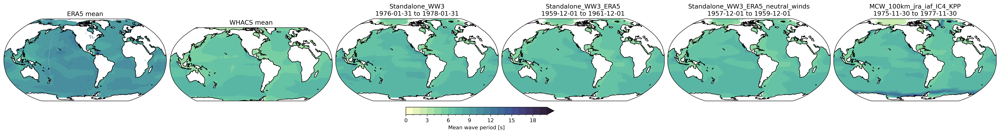

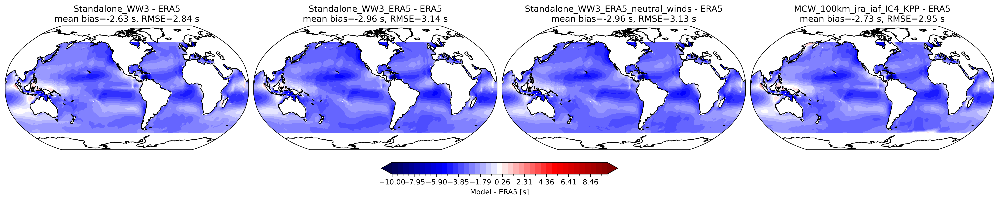

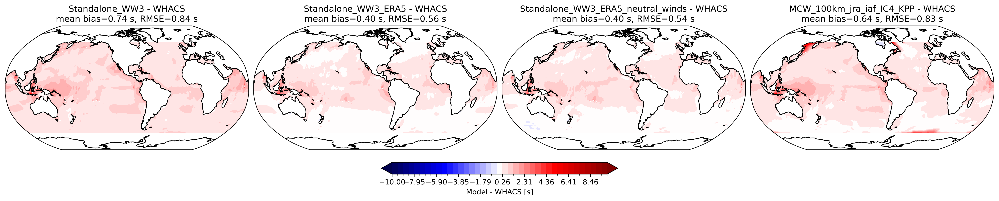

In [37]:
nexp = len(multi_results_era5)

# ---------- Figure 1: ERA5 mean, WHACS mean, and model means ----------
fig, axs = plt.subplots(
    1,
    nexp + 2,
    figsize=(4.4 * (nexp + 2), 4.8),
    subplot_kw={"projection": ccrs.Robinson(central_longitude=-100)},
    constrained_layout=True,
)

levels_mean = np.linspace(0, 20, 21)

im0 = obs_for_interp_era5.plot.contourf(
    ax=axs[0],
    x="longitude",
    y="latitude",
    transform=ccrs.PlateCarree(),
    cmap=cmocean.cm.deep,
    levels=levels_mean,
    vmin=0,
    vmax=20,
    add_colorbar=False,
    extend="max",
)
axs[0].set_title("ERA5 mean")
axs[0].coastlines()

obs_for_interp_whacs.plot.contourf(
    ax=axs[1],
    x="longitude",
    y="latitude",
    transform=ccrs.PlateCarree(),
    cmap=cmocean.cm.deep,
    levels=levels_mean,
    vmin=0,
    vmax=20,
    add_colorbar=False,
    extend="max",
)
axs[1].set_title("WHACS mean")
axs[1].coastlines()

for i, res in enumerate(multi_results_era5, start=2):
    res["model"].plot.contourf(
        ax=axs[i],
        x=res["xdim"],
        y=res["ydim"],
        transform=ccrs.PlateCarree(),
        cmap=cmocean.cm.deep,
        levels=levels_mean,
        vmin=0,
        vmax=20,
        add_colorbar=False,
        extend="max",
    )
    axs[i].set_title(
        f"{res['exptname']}\n"
        f"{res['datestart'].strftime('%Y-%m-%d')} to {res['datestop'].strftime('%Y-%m-%d')}"
    )
    axs[i].coastlines()

cbar = fig.colorbar(im0, ax=axs, orientation="horizontal", fraction=0.05, pad=0.04)
cbar.set_label("Mean wave period [s]")

# ---------- Figure 2: model - ERA5 bias for each run ----------
levels_bias = np.linspace(-10, 10, 40)

fig, axs = plt.subplots(
    1,
    nexp,
    figsize=(4.8 * nexp, 4.8),
    subplot_kw={"projection": ccrs.Robinson(central_longitude=-100)},
    constrained_layout=True,
)
if nexp == 1:
    axs = [axs]

imb_era5 = None
for ax, res in zip(axs, multi_results_era5):
    imb_era5 = res["bias"].plot.contourf(
        ax=ax,
        x=res["xdim"],
        y=res["ydim"],
        transform=ccrs.PlateCarree(),
        cmap="seismic",
        levels=levels_bias,
        vmin=-10,
        vmax=10,
        add_colorbar=False,
        extend="both",
    )
    ax.set_title(
        f"{res['exptname']} - ERA5\n"
        f"mean bias={res['mean_bias']:.2f} s, RMSE={res['rmse']:.2f} s"
    )
    ax.coastlines()

cbar = fig.colorbar(imb_era5, ax=axs, orientation="horizontal", fraction=0.06, pad=0.06)
cbar.set_label("Model - ERA5 [s]")

# ---------- Figure 3: model - WHACS bias for each run ----------
fig, axs = plt.subplots(
    1,
    nexp,
    figsize=(4.8 * nexp, 4.8),
    subplot_kw={"projection": ccrs.Robinson(central_longitude=-100)},
    constrained_layout=True,
)
if nexp == 1:
    axs = [axs]

imb_whacs = None
for ax, res in zip(axs, multi_results_whacs):
    imb_whacs = res["bias"].plot.contourf(
        ax=ax,
        x=res["xdim"],
        y=res["ydim"],
        transform=ccrs.PlateCarree(),
        cmap="seismic",
        levels=levels_bias,
        vmin=-10,
        vmax=10,
        add_colorbar=False,
        extend="both",
    )
    ax.set_title(
        f"{res['exptname']} - WHACS\n"
        f"mean bias={res['mean_bias']:.2f} s, RMSE={res['rmse']:.2f} s"
    )
    ax.coastlines()

cbar = fig.colorbar(imb_whacs, ax=axs, orientation="horizontal", fraction=0.06, pad=0.06)
cbar.set_label("Model - WHACS [s]")
